In [1]:
%matplotlib inline
from model import inceptionv4,inceptionresnetv2
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from matplotlib import cm as CM
import matplotlib
from torch.utils.data import Dataset,DataLoader
from torchvision import transforms
import os
from PIL import Image

class Udf_Dataset(Dataset):
    
    def __init__(self, data_path, trans=True):
        super(Udf_Dataset, self).__init__()
        self.data_path = data_path
        self.img_dir = [os.path.join(data_path, class_name) for class_name in os.listdir(data_path)]
        self.img_dir.sort()
        self.nb_class = len(self.img_dir)
        self.image_names = [os.listdir(dir_name) for dir_name in self.img_dir]
        
        # For index purpose
        self.nb_images = [len(os.listdir(dir_name)) for dir_name in self.img_dir]
        self.start_index = np.array([sum(self.nb_images[:i]) for i in range(self.nb_class)])
        self.trans = trans
        self.transform = transforms.Compose([transforms.RandomResizedCrop(299, scale=(0.3, 1.0)), transforms.RandomHorizontalFlip()])
        self.to_tensor = transforms.ToTensor()
        
    def get_index_class(self, index):
        return np.argwhere(self.start_index <= index)[-1][0]
    
    def __getitem__(self, index):
        index_class = self.get_index_class(index)
        try:
            image = cv2.resize(cv2.imread(os.path.join(self.img_dir[index_class], self.image_names[index_class][index-self.start_index[index_class]])), (299,299))
        except:
            print(os.path.join(self.img_dir[index_class], self.image_names[index_class][index-self.start_index[index_class]]))
        image = np.array(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        image = Image.fromarray(image)
        if self.trans:
            image = self.transform(image)
        image = self.to_tensor(image)
        #image = image/255.0
        #print(image)
        
        return image, index_class
    
    def __len__(self):
        return sum(self.nb_images)
    
train_data_path = '../train_data'
test_data_path = '../test_data'

trainset = Udf_Dataset(train_data_path, trans=False)
testset = Udf_Dataset(test_data_path, trans=False)

trainloader = DataLoader(trainset, batch_size=16, shuffle=True)
testloader = DataLoader(testset, batch_size=16, shuffle=True)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = inceptionresnetv2()
model.load_state_dict(torch.load('./v2/IRnet_pretrained.pkl'))
model = model.to(device)

In [2]:
from attacks import pgd_attack

In [3]:
images, labels = next(iter(trainloader))

In [4]:
image = images[0]
label = labels[0]

In [5]:
adv_img = pgd_attack(model, image, device, iteration=10)

/tf/IJCAI/ICJAI_haojie/defense/attacks.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  target = torch.tensor(target, dtype=torch.long)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


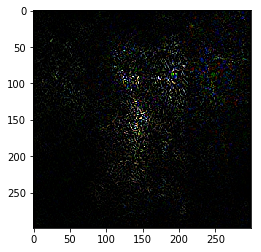

In [6]:
plt.imshow(100*(adv_img.cpu().detach()-images[0]).reshape(-1,299,299).permute(1,2,0))

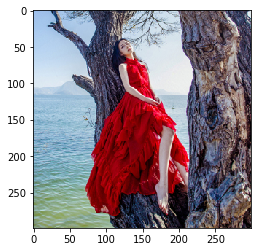

In [7]:
plt.imshow(adv_img.cpu().detach().reshape(-1,299,299).permute(1,2,0))

In [8]:
model.eval()
with torch.no_grad():
    output_adv = model(adv_img.view(-1,3,299,299).to(device, dtype=torch.float))
    _, predicted_adv = torch.max(output_adv.data, 1)
    output_normal = model(images[0].view(-1,3,299,299).to(device, dtype=torch.float))
    _, predicted_normal = torch.max(output_normal.data, 1)

In [9]:
predicted_normal

tensor([45], device='cuda:0')

In [10]:
label

tensor(45)

In [11]:
predicted_adv

tensor([10], device='cuda:0')

# Calculate features & Grads

In [12]:
model.eval()
proceeding = list(model.children())
clean_activations = []
adv_activations = []

In [13]:
clean_activation = None
adv_activation = None

In [14]:
image = image.reshape(-1,3,299,299)
adv_img = adv_img.reshape(-1,3,299,299)
i = 0

for layer in proceeding:
    if i == 17:
        clean_activation = clean_activation.view(clean_activation.shape[0], -1)
        adv_activation = adv_activation.view(adv_activation.shape[0], -1)
    
    # First layer take origin image as input
    clean_activation = layer(image.to(device, torch.float).requires_grad_(True)) \
                        if clean_activation is None \
                        else layer(clean_activation)
    adv_activation = layer(adv_img.to(device, torch.float).requires_grad_(True)) \
                        if adv_activation is None \
                        else layer(adv_activation)
    
    # Retain grad in middle layers
    clean_activation.retain_grad()
    adv_activation.retain_grad()
    
    clean_activations.append(clean_activation)
    adv_activations.append(adv_activation)
    i += 1 

In [15]:
clean_activation[0][16].backward()
adv_activation[0][16].backward()

# Use gradient mean as weight

In [16]:
clean_weights = [torch.sum(clean_activation.grad**2, dim=(-1,-2), keepdim=True) for clean_activation in clean_activations]
adv_weights = [torch.sum(adv_activation.grad**2, dim=(-1,-2), keepdim=True) for adv_activation in adv_activations]

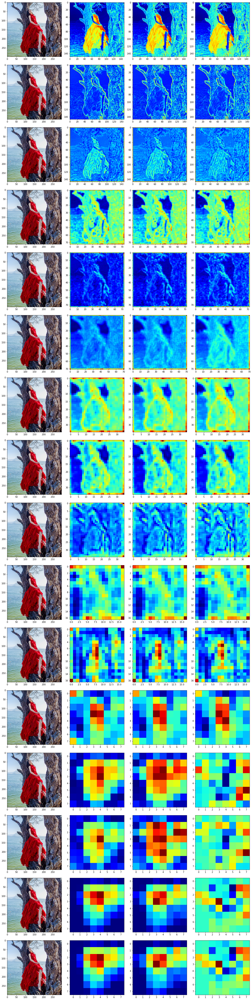

In [18]:
fig, axs = plt.subplots(16, 4, figsize=(16,64), constrained_layout=True)
for i in range(16):
    axs[i, 0].imshow(image.cpu().detach().reshape(-1,299,299).permute(1,2,0))
    axs[i, 1].imshow(torch.sum(clean_activations[i]*clean_weights[i], dim=-3).cpu().detach()[0] , cmap=CM.jet)
    axs[i, 2].imshow(torch.sum(adv_activations[i]*adv_weights[i], dim=-3).cpu().detach()[0], cmap=CM.jet)
    axs[i, 3].imshow(torch.sum(adv_activations[i]*adv_weights[i], dim=-3).cpu().detach()[0]-torch.sum(clean_activations[i]*clean_weights[i], dim=-3).cpu().detach()[0], cmap=CM.jet)
plt.show()

In [24]:
i = 0
a = torch.sum(adv_activations[i]*adv_weights[i], dim=-3).cpu().detach()[0]- \
      torch.sum(clean_activations[i]*clean_weights[i], dim=-3).cpu().detach()[0]
b = torch.sum(adv_activations[i]*adv_weights[i], dim=-3).cpu().detach()[0]
c = torch.sum(clean_activations[i]*clean_weights[i], dim=-3).cpu().detach()[0]
print((b/c).min(), (b/c).max())
print((a/c).min(), (a/c).max())

tensor(2.1393) tensor(2.2427)
tensor(1.1393) tensor(1.2427)


### 使用Grad-CAM算法得到的attention map 前几层只能看到数量级上的差异。考虑在前几层通道数量还可以接受的情况下打印激活值。

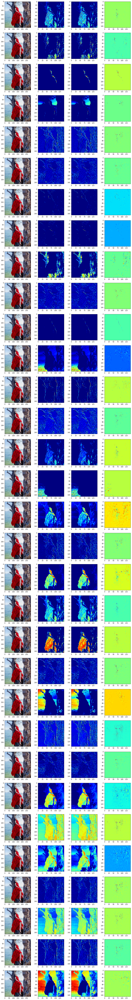

In [19]:
fig, axs = plt.subplots(32, 4, figsize=(16,128))
feature_layer = 0
for i in range(32):
    axs[i, 0].imshow(image.cpu().detach().reshape(-1,299,299).permute(1,2,0))
    axs[i, 1].imshow(clean_activations[feature_layer][0][i].cpu().detach(), cmap=CM.jet)
    axs[i, 2].imshow(adv_activations[feature_layer][0][i].cpu().detach(), cmap=CM.jet)
    axs[i, 3].imshow(adv_activations[feature_layer][0][i].cpu().detach()-clean_activations[feature_layer][0][i].cpu().detach(), cmap=CM.jet)
plt.show()

### 通道数较多的情况下随机挑选channel打印

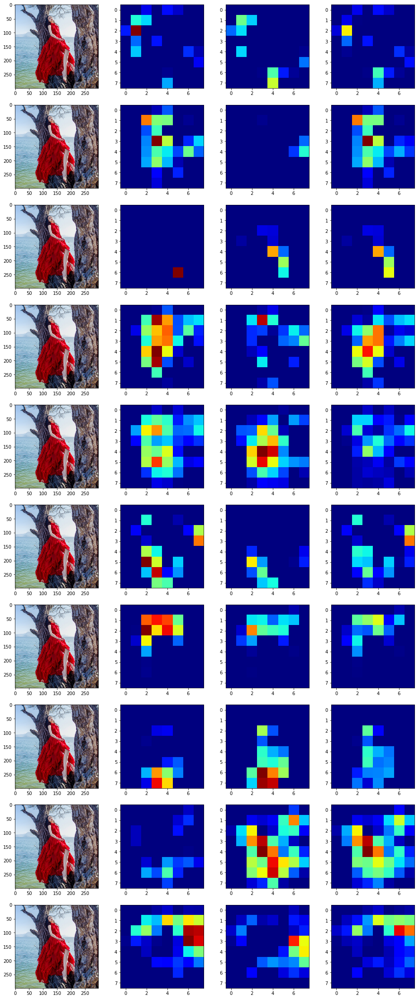

In [88]:
fig, axs = plt.subplots(10, 4, figsize=(16,40))
feature_layer = 15
rand_channel = np.random.randint(0, adv_activations[feature_layer].shape[1], size=10)
avoid_zero = 1e-10
for i in range(10):
    # 将feature map放缩到0～1之间, 指定热度图的最大最小值， 避免pyplot自动放缩
    clean_feature = clean_activations[feature_layer][0][rand_channel[i]].cpu().detach()
    adv_feature = adv_activations[feature_layer][0][rand_channel[i]].cpu().detach()
    feature_deta = adv_feature - clean_feature
    normalzie_factor = max([clean_feature.max(), adv_feature.max(), feature_deta.max(), avoid_zero])
    
    axs[i, 0].imshow(image.cpu().detach().reshape(-1,299,299).permute(1,2,0))
    axs[i, 1].imshow(clean_feature/normalzie_factor, cmap=CM.jet, vmin = 0, vmax = 1)
    axs[i, 2].imshow(adv_feature/normalzie_factor, cmap=CM.jet, vmin = 0, vmax = 1)
    axs[i, 3].imshow(torch.abs(feature_deta/normalzie_factor), cmap=CM.jet, vmin = 0, vmax = 1)
plt.show()

In [71]:
max(tmp1, tmp2, tmp3, 1e-10)

tensor(8.2806)

In [27]:
feature_layer = 2
rand_channel = np.random.randint(0, adv_activations[feature_layer].shape[1], size=10)

In [28]:
rand_channel

array([10, 36, 51, 23,  2, 18, 38, 53, 16, 17])

In [192]:
torch.sum(adv_activations[0]*weight, dim=-3).shape

torch.Size([1, 149, 149])

In [196]:
weight = torch.sum(clean_activations[0].grad**2, dim=(-1,-2), keepdim=True)

In [191]:
torch.sum(adv_activations[0], dim=-3)

tensor([[[12.0808, 12.0810, 12.0809,  ..., 11.9189, 11.9019, 11.8201],
         [12.0810, 12.0806, 12.0810,  ..., 11.8904, 11.8194, 11.7730],
         [12.0809, 12.0809, 12.0804,  ..., 12.0487, 12.5349, 11.7604],
         ...,
         [13.0774, 13.0779, 13.0771,  ..., 13.0714, 13.0732, 13.0709],
         [13.0773, 13.0769, 13.0778,  ..., 13.0792, 13.0723, 13.0819],
         [13.0775, 13.0777, 13.0774,  ..., 13.0735, 13.0781, 13.0787]]],
       device='cuda:0', grad_fn=<SumBackward2>)

In [200]:
for i in range(len(adv_activations)):
    print(adv_activations[i].grad.shape)

torch.Size([1, 32, 149, 149])
torch.Size([1, 32, 147, 147])
torch.Size([1, 64, 147, 147])
torch.Size([1, 64, 73, 73])
torch.Size([1, 80, 73, 73])
torch.Size([1, 192, 71, 71])
torch.Size([1, 192, 35, 35])
torch.Size([1, 320, 35, 35])
torch.Size([1, 320, 35, 35])
torch.Size([1, 1088, 17, 17])
torch.Size([1, 1088, 17, 17])
torch.Size([1, 2080, 8, 8])
torch.Size([1, 2080, 8, 8])
torch.Size([1, 2080, 8, 8])
torch.Size([1, 1536, 8, 8])
torch.Size([1, 1536, 8, 8])
torch.Size([1, 1536, 1, 1])
torch.Size([1, 110])


In [139]:
clean_activations[2][0].shape

torch.Size([64, 147, 147])

# Draw attention map using grad CAM

Calculate Gradients from output to each layer feature

In [ ]:
def visualize(model, clean_img, adv_img, reshape_layer=None):
    model.eval()
    # step1, get output of each layer
    proceeding = list(model.children())
    clean_activations = []
    adv_activations = []
    